# HW1 
+ Q1 Homographies (25 points)
+ 1.1 Definition and rank of a homography
  + Q1.1 what is the size of the matrix S? 
  -> 3x3
  + Q1.2 what is the rank of the matrix S? Explain. 
  -> Rank is 3,Homography relates points in first view to points in the second view and since there are no constraints in either views it is a full rank (=3) matrix 
  + Q1.3 what is the minimum number of point correspondences (p,q) required to estimate S? why? 
  -> four points are required becasue homography has 8 degree of freedom. 
  From  
  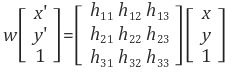  
  let q = (x, y, 1) and p = (wx', wy', w) be homogeneous coordinates. and S has 3x3 matrix with element hij(i = 1,2,3, and j = 1,2,3). homography is defined upto a scale (w in above equation) i.e. it can be changed by a non zero constant without any affect on projective transformation. Thus, homography has 8 degree of freedom even though it contains 9 elements (3x3 matrix). Therefore, we need 4 points since each point has x and y coordinates and there are total 8 unknowns to solve S for a unique solution.

+ 1.2 Homography between cameras
+ Q1.4 Suppose we have two cameras $c_1\\$ and $c_2\\$ viewing a plane II in 3D space. A 3D point P on the plane II is projected into the cameras resulting in 2D points $u \equiv (x_1, y_1, 1)$ and $v \equiv (x_2, y_2, 1)$. Prove that there exists a homography between the points $u$ and $v$. 

Let these points are related by the estimated homography H, as follows: 

$$
\begin{pmatrix}
x_a \\
y_a \\
z_a
\end{pmatrix}
= H_{3X3}
\begin{pmatrix}
x_1 \\
y_1 \\
1
\end{pmatrix}
$$

because $u$ and $v$ are the homogeneous coordinates, 

$$
\begin{pmatrix}
x_2 \\
y_2 \\
1
\end{pmatrix}
= \frac{1}{z_a}
\begin{pmatrix}
x_a \\
y_a \\
z_a
\end{pmatrix}
$$  

thus, any point from camera $c_1$ may be mapped to a corresponding point in the second camera image through homography. 



+ 2 Panoramas (40 points)
+ 2.1 Homogrphy estimation 
  + Q2.1

From $p_1^i = Hp_2^i$, 

because $p_i^i$ and $p_2^i$ are homogeneous coordinates, 

$p_1^i = KHp_2^i$ where $K$ is a constant. 

$$
\begin{pmatrix}
x'\\
y'\\
1
\end{pmatrix}
= \alpha
\begin{pmatrix}
h_1, h_2, h_3 \\
h_4, h_5, h_6 \\
h_7, h_8, h_8
\end{pmatrix}
\begin{pmatrix}
x\\
y\\
1
\end{pmatrix}
$$ 

$$
x' = \alpha
\left(h_1x + h_2y +h_3\right)\\
y' = \alpha
\left(h_4x + h_5y +h_6\right)\\
1 = \alpha
\left(h_7x + h_8y +h_9\right)\\
$$  

then, 

$$
x'\left(h_7x + -h_8y +h_8\right) = \left(h_1x + h_2y +h_3\right)\\
y'\left(h_7x + h_8y +h_8\right) = \left(h_4x + h_5y +h_6\right)\\
$$  

$$
h_7xx'\ + h_8yx' + h_9x' - h_1x - h_2y - h_3 = 0\\
h_7xy'\ + h_8yy' + h_9y' - h_4x - h_5y - h_6 = 0
$$  

therefore, 
$$
A_i = 
\begin{pmatrix}
-x, -y, -1, 0, 0, 0, xx', yx', x' \\
0, 0, 0, -x, -y, -1, xy', yy', y' \\
\end{pmatrix}
$$
$$
h = 
\begin{pmatrix}
h_1, h_2, h_3, h_4, h_5, h_6, h_7, h_8, h_9 \\
\end{pmatrix}^T
$$

$$
b = 
\begin{pmatrix}
0, 0, 0, 0, 0, 0, 0, 0, 0 \\
\end{pmatrix}^T
$$

In order to solve $Ah =B$, we need four correspondences. 

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# install requirement
!pip install -r '/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/requirements.txt'

     |████████████████████████████████| 147 kB 5.0 MB/s 
     |████████████████████████████████| 1.1 MB 49.0 MB/s 
     |████████████████████████████████| 12.9 MB 30.3 MB/s 
     |████████████████████████████████| 14.8 MB 34.6 MB/s 
     |████████████████████████████████| 50.4 MB 41 kB/s 
     |████████████████████████████████| 2.0 MB 45.0 MB/s 
     |████████████████████████████████| 67 kB 4.7 MB/s 
     |████████████████████████████████| 117.8 MB 83 kB/s 
     |████████████████████████████████| 67 kB 3.8 MB/s 
     |████████████████████████████████| 227 kB 33.1 MB/s 
     |████████████████████████████████| 25.9 MB 1.9 MB/s 
  Created wheel for cpselect: filename=cpselect-1.0.3-py3-none-any.whl size=14953 sha256=3001ee27b5304b2b876f3135aaf0c55658a0dbc604af130db5ed0194c565c94c
  Stored in directory: /root/.cache/pip/wheels/58/ed/21/61290c229384e37226bd532c53470cc04a03bf6fc930a31ade
Successfully built cpselect
  Attempting uninstall: python-dateutil
    Found existing installation: pyth

# 2.1 Homography estimation

In [1]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from typing import Tuple
from cpselect.cpselect import cpselect

In [ ]:
# panoramas - save .npz
im1_dir = "/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/taj1.jpg"
im2_dir = "/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/taj2.jpg"

# BGR
im1 = cv2.imread("/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/taj1.jpg") 
im2 = cv2.imread("/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/taj2.jpg")

point_list = cpselect(im1_dir, im2_dir)
p1, p2 = [], []

for point in point_list:
  p1.append([point["img1_x"], point["img1_y"]])
  p2.append([point["img2_x"], point["img2_y"]])

p1 = np.array(p1)
p2 = np.array(p2)
np.savez("/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/taj_points.npz", p1 = p1, p2 = p2)

# Q 2.2. 

In [2]:
def computeH(p1, p2):
  # Inputs: p1 and p2 should be N x 2 matrices of corresponded (x, y)T coordinates between two images.
  # Outputs: H should be a 3x3 matrix encoding the homography that best matches the linear equation derived above (in the least squares sense).
  A = []
  for i in range(0, len(p1)):
    x, y = p1[i][0], p1[i][1]
    u, v = p2[i][0], p2[i][1]
    A.append([-x, -y, -1, 0, 0, 0, u*x, u*y, u])
    A.append([0, 0, 0, -x, -y, -1, v*x, v*y, v])
  
  A = np.asarray(A)
  #print(A)
  U, S, Vh = np.linalg.svd(A)
  # print(S) : scaling factor -> big to small 
  H = Vh[-1, :] / Vh[-1,-1]
  H = H.reshape(3,3)

  return H

In [3]:
# test Q 2.2

p1 = [[93,-7], [293,3], [1207,7], [1218,3]]
p2 = [[63,0], [868,-6], [998,-4], [309,2]]

homography = computeH(p1,p2)
print(homography)
transformedPoint = homography @ np.array([1679,  128, 3]).transpose()
print(transformedPoint/transformedPoint[-1])

[[-7.01074779e-01  8.63563186e+01  7.22785718e+02]
 [ 6.69753724e-03 -6.70660259e-01 -5.31749277e+00]
 [-5.19408054e-04  1.55674721e-02  1.00000000e+00]]
[ 2.92311960e+03 -2.19756634e+01  1.00000000e+00]


# Q2.3

In [4]:
# normalization coordinate
def norm(pts, dim): 
  # pts : n x 2 array
  # dim : dimensions
  m = np.mean(pts, axis = 0) # centroid
  s = np.std(pts) 
  
  # homogeneous coordinates
  if dim == 2: 
    T = np.array([[s, 0, m[0]], [0,s,m[1]], [0,0,1]])
  else:
    T = np.array([[s,0,0,m[0]], [0,s,0,m[1]], [0,0,s,m[2]], [0,0,0,1]])

  T = np.linalg.inv(T) # Inverse matrix
  pts = np.dot(T, np.concatenate([pts.T, np.ones((1,pts.shape[0]))])) # homogeneous
  pts = pts[0:dim, :].T # inhomogenous

  return T, pts

In [5]:
def computeH_norm(p1, p2):
  '''
  This version should normalize the coordinates p1 and p2 (e.g., from -1 to 1) prior to calling compute_H. Normalization 
  improves numerical stability of the solution. Note that the resulting H should still follow Eq. (2). Hint: Express the normalization as a matrix.
  '''
  p1 = np.array(p1)
  p2 = np.array(p2)
  dim = p1.shape[1]
  T1, p1 = norm(p1, dim) # call norm1 function
  T2, p2 = norm(p2, dim)

   
  H_norm = computeH(p1,p2)
  H = np.dot(np.dot(np.linalg.pinv(T2), H_norm), T1) # inv(T2)*H_norm*T1
  H = H / H[-1,-1] 

  return H

In [6]:
homography = computeH_norm(p1,p2)
print(homography)

[[-7.01074779e-01  8.63563186e+01  7.22785718e+02]
 [ 6.69753724e-03 -6.70660259e-01 -5.31749277e+00]
 [-5.19408054e-04  1.55674721e-02  1.00000000e+00]]


# Q2.4

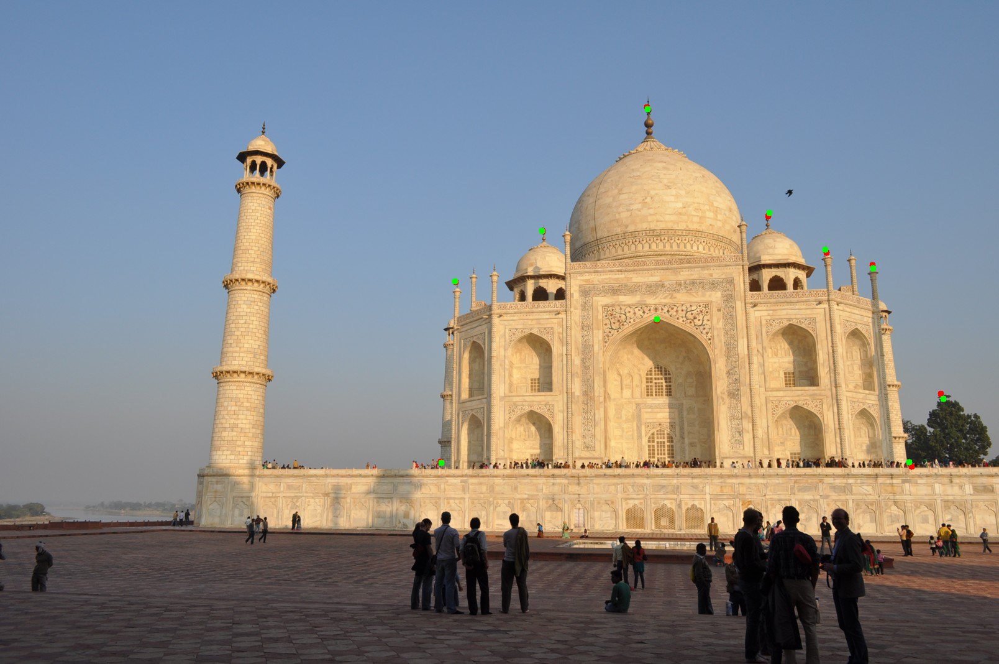

5.107710503991534


In [7]:
im1_dir = "/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/taj1.jpg"
im2_dir = "/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/taj2.jpg"


im1 = cv2.imread(im1_dir)
im2 = cv2.imread(im2_dir)

pts = np.load("/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/taj_points.npz")
p1 = pts["p1"]
p2 = pts["p2"]

# Distance: Hp2 - p1
H21 = computeH_norm(p2, p1)
# np.concatenate(p2.T, np.ones((1,p2.shape[0]))) - > example: (2,N) + (1,N) -> (3,N) 
#print(p2.T.shape)
#print(np.ones((1,p2.shape[0])).shape)
#print(H21.shape)
p2_t = np.dot(H21, np.concatenate((p2.T, np.ones((1,p2.shape[0]))))) 
p2_t = p2_t / p2_t[2,:] # to make [a,b,c] -> [a',b',1]
p2_t = p2_t.T[:,:2] # [a',b',1] -> [a',b']

# red point from p1
for point1 in p1:
  cv2.circle(im1, (int(point1[0]),int(point1[1])), 5, (0, 0, 255), -1)

# green point from p2_t
for point2_t in p2_t:
  cv2.circle(im1, (int(point2_t[0]),int(point2_t[1])), 5, (0, 255, 0), -1) 

cv2_imshow(im1)
cv2.imwrite("/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/q2_4.jpg", im1)

# save .npz
np.savez("/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/q2_4.npz", H21, p1, p2, p2_t)

# compute error
err = np.sqrt(np.mean(np.sum((p2_t - p1)**2, 1)))
print(err)

# 2.2 Image warping

In [8]:
def warpH(im, H, out_size, fill_value = 0):
    """
        im: an image HxWx3
        H: a 3x3 transfomration matrix
        out_size: a tuple (W, H)
        fill_value: fill into empty regions
    """
    return cv2.warpPerspective(im, H, out_size, borderValue = fill_value)

# Q2.5

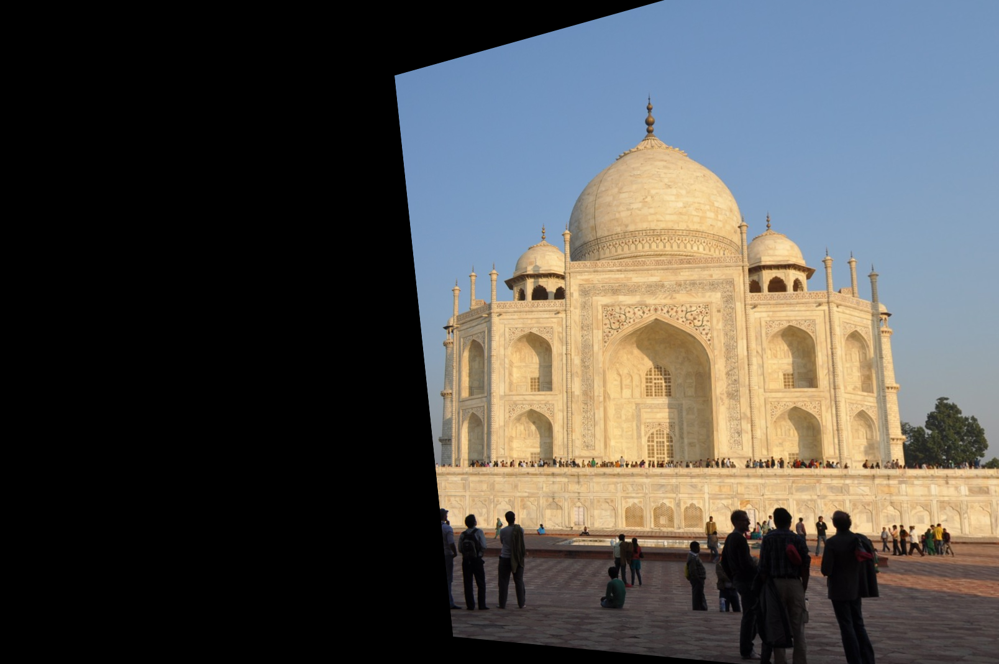

In [9]:
im1_dir = "/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/taj1.jpg"
im2_dir = "/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/taj2.jpg"

im1 = cv2.imread(im1_dir)
im2 = cv2.imread(im2_dir)

pts = np.load("/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/taj_points.npz")
p1 = pts["p1"]
p2 = pts["p2"]

H21 = computeH_norm(p2, p1)
warped = warpH(im2, H21, (im1.shape[1], im1.shape[0]))
cv2_imshow(warped)

In [10]:
def findM(im1, im2, H):
  # find M matrix and out size: warp_im1 = warpH(im2, M, outsize), warp_im2 = warpH(im2, M@H21, outsize)
  # all points in im1 and im2 are visible

  # image shape
  h1, w1 = im1.shape[:2]
  h2, w2 = im2.shape[:2]

  # four corresponding points : (left top, left bottom, right bottom, right top) for im1, im2 
  pts1 = np.array([[0,0], [0,h1], [w1,h1], [w1,0]]).reshape(-1,1,2).astype(np.float32) 
  pts2 = np.array([[0,0], [0,h2], [w2,h2], [w2,0]]).reshape(-1,1,2).astype(np.float32)
  # print(pts1.shape)

  #transformed point2 through homography
  pts2_ = cv2.perspectiveTransform(pts2, H21)
  pts = np.concatenate((pts1, pts2_), axis = 0) # 8x2 -> collect all points in im1 and im2 to be visible
  #print(pts)

  # (pts.min(axis = 0).ravel()) = [min(x), min(y)]
  # scaling (out_size[1] ==1280)
  [xmin, ymin] = np.array(pts.min(axis = 0).ravel()-0.5).astype(np.int32)
  [xmax, ymax] = np.array(pts.max(axis = 0).ravel()+0.5).astype(np.int32)
  scale = 1280/(ymax - ymin)
  out_x = int(scale*(xmax-xmin)) 
  out_y = int(scale*(ymax-ymin))

  M = np.array([[scale,0, -scale*xmin], [0,scale, -scale*ymin], [0,0,1]])
  #print(M)
  return M, (out_x, out_y)

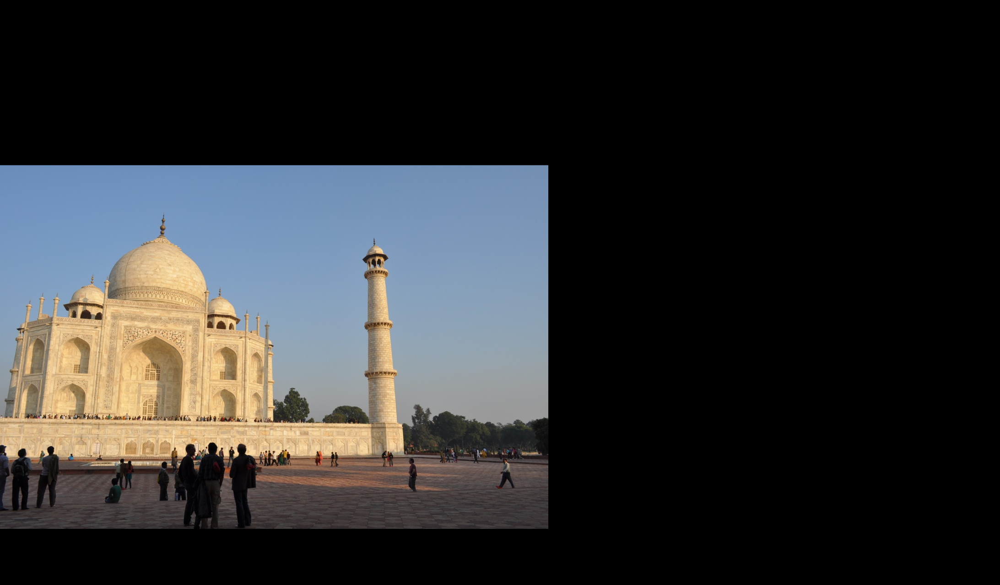

In [11]:
im1_dir = "/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/taj1.jpg"
im2_dir = "/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/taj2.jpg"

im1 = cv2.imread(im1_dir)
im2 = cv2.imread(im2_dir)

pts = np.load("/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/taj_points.npz")
p1 = pts["p1"]
p2 = pts["p2"]

H21 = computeH_norm(p2, p1)

M, out_shape = findM(im1,im2, H21)

warped2 = warpH(im2, M, out_shape)
cv2_imshow(warped2)

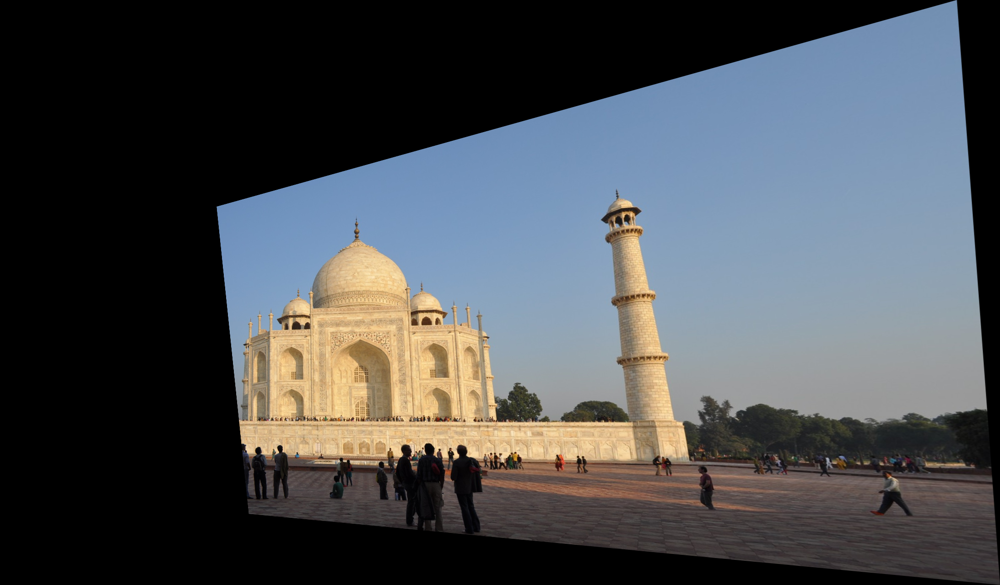

In [12]:
warped3 = warpH(im2, M@H21, out_shape)
cv2_imshow(warped3)

#combined = np.concatenate([warped2, warped3], axis=1)
#cv2_imshow(combined)

# 2.3 Image blending

- ref
- https://docs.opencv.org/3.4/dc/dff/tutorial_py_pyramids.html
- https://laconicml.com/blend-images-laplacian-pyramid/
- https://theailearner.com/tag/image-blending-using-pyramids-opencv/
- https://hackthedeveloper.com/image-blending-opencv-python/
- https://gist.github.com/royshil/0b20a7dd08961c83e210024a4a7d841a


In [13]:
def blending(im1, im2, H, save_dir = '/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code'):

  h1, w1 = im1.shape[:2]
  h2, w2 = im2.shape[:2]

  # four corresponding points : (left top, left bottom, right bottom, right top) for im1, im2 
  pts1 = np.array([[0,0], [0,h1], [w1,h1], [w1,0]]).reshape(-1,1,2).astype(np.float32) 
  pts2 = np.array([[0,0], [0,h2], [w2,h2], [w2,0]]).reshape(-1,1,2).astype(np.float32)

  #transformed point2 through homography
  pts2_ = cv2.perspectiveTransform(pts2, H21)
  pts = np.concatenate((pts1, pts2_), axis = 0) # 8x2 -> collect all points in im1 and im2 to be visible

  # scaling (out_size[1] ==1280)
  [xmin, ymin] = np.array(pts.min(axis = 0).ravel()-0.5).astype(np.int32)
  [xmax, ymax] = np.array(pts.max(axis = 0).ravel()+0.5).astype(np.int32)
  scale = 1280/(ymax - ymin)
  out_x = int(scale*(xmax-xmin)) 
  out_y = int(scale*(ymax-ymin))

  M = np.array([[scale,0, -scale*xmin], [0,scale, -scale*ymin], [0,0,1]])

  warped = warpH(im2, M@H, (out_x, out_y)) # 1280 x 2185 x 3 

  # resize tmp image by scaling ratio:(1280, 2185, 3) -> (795, 1198, 3) and copy the resized original image 1 
  tmp = np.zeros_like(warped) # 0 array with the same size of warped
  tmp[int(-scale*ymin): int(-scale*ymin)+int(scale*h1),
      int(-scale*xmin):int(-scale*xmin)+int(scale*w1)] = cv2.resize(im1, (int(scale*w1), int(scale*h1)))

  # create mask
  # when the corresponding pixels from two images (warped and tmp) are not black, mask value = 1(True), otherwise 0(False)
  '''
  mask = np.logical_and(warped > 0, tmp > 0)*255 
  cv2_imshow(mask) #show overlapped area from (warped and tmp)
  '''
  # mask : save the idx of overlapped pixel points. (overlapped: True, otherwise False) 
  mask = np.logical_and(warped > 0, tmp > 0)

  # blending : average blending (warped and tmp)
  blend = 0.5*warped[mask] + 0.5*tmp[mask] 
  warped[int(-scale*ymin): int(-scale*ymin)+int(scale*h1),
      int(-scale*xmin):int(-scale*xmin)+int(scale*w1)] = cv2.resize(im1, (int(scale*w1), int(scale*h1)))
  warped[mask] = blend
  cv2_imshow(warped)
  cv2.imwrite(save_dir +'/q2_7.jpg', warped)

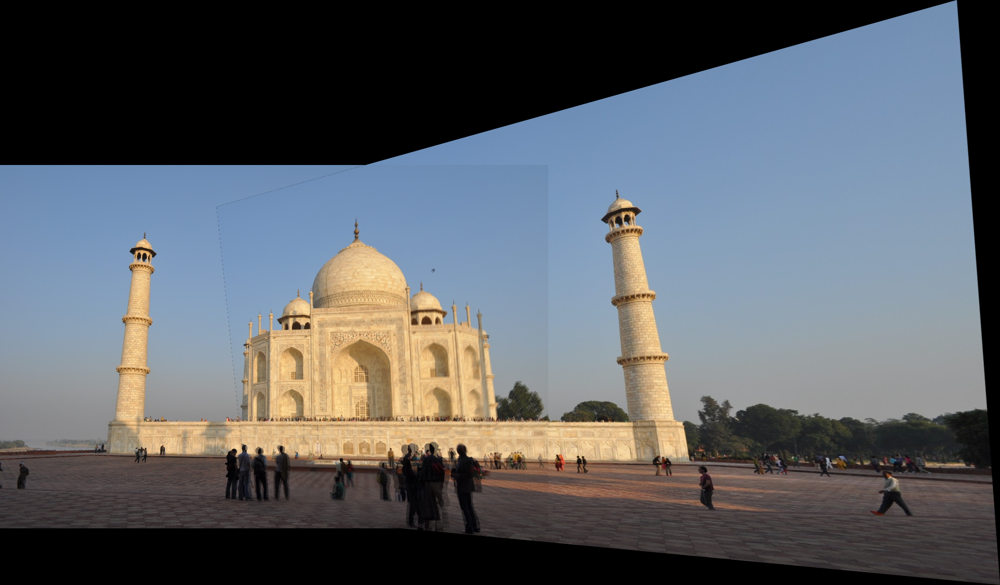

In [14]:
blending(im1, im2, H21, save_dir = '/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code')

# Q2.7
- when two view are from the same camera and roation only applied, in order to calculate homography matrix, only radian angle would be required. therefore, 8 degrees of freedom would be reduced to 1 degree of freedom.   

# QX1  
- assume that the rotation between the cameras is only around the y axis. Using H2to1, and assuming no skew, and alpha = beta = 1274.4, u0 = 814.1, and v0 = 526.6, estimate the angle of rotation between the views. 

- from intrinsic camera matrix K, rotation matrix R, and point P

$$
K
= 
\begin{pmatrix}
f_x, s=0, u_0 \\
0, f_y, v_0 \\
0, 0, 1
\end{pmatrix}\\
p_1^i = Kp_i\\ 
p_2^i = KRp_i\\
therefore, \ p_1^i = KR^{-1}K^{-1}p_2^i = Hp_2^i
$$



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


 final_simplex: (array([[26.37472791],
       [26.37472791]]), array([31.14218611, 31.14218611]))
           fun: 31.142186114732684
       message: 'Optimization terminated successfully.'
          nfev: 96
           nit: 47
        status: 0
       success: True
             x: array([26.37472791])


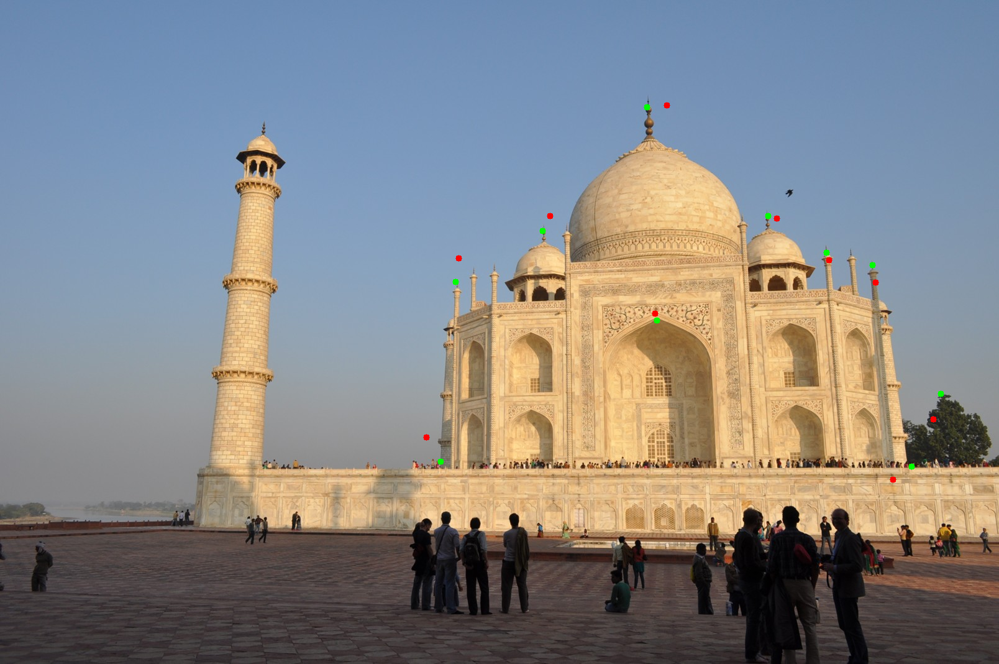

In [15]:
'''
QX1:  
assume that the rotation between the cameras is only around the y axis. Using H2to1, 
and assuming no skew, and alpha = beta = 1274.4, u0 = 814.1, and v0 = 526.6, 
estimate the angle of rotation between the views. 
'''
pts = np.load("/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/taj_points.npz")
p1 = pts["p1"]
p2 = pts["p2"]

alpha, beta = 1274.4, 1274.4 # ahlpha = f_x, beta = f_y
u0, v0 = 814.1, 526.6

H21 = computeH_norm(p2, p1)

K = [[alpha, 0, u0], [0, beta, v0], [0,0,1]] 
K = np.array(K)

# from 3D y-axis rotation : lambda function of angle 'x' 
R_y = lambda x: np.array([[np.cos(np.radians(x)), 0, np.sin(np.radians(x))],
                          [0,1,0],
                          [-np.sin(np.radians(x)), 0, np.cos(np.radians(x))]])

H = lambda x: K@R_y(x)@np.linalg.inv(K) # K*R_y*inv(K) = H

# want to minimize error: distance of (p2_t - p1) where p2_t = Hp2 
# objective funtion f(x)
def obj_function(x): 
  p2_t = np.dot(H(x), np.concatenate((p2.T, np.ones((1,p2.shape[0]))))) # p2_t = Hp2 (homogeneous coordinates)
  p2_t = p2_t/p2_t[2, :] # homogeneous: (a,b,c) -> (a', b', 1)
  p2_t = p2_t.T[:,:2] # homogeneous -> inhomogeneous
  return np.sqrt(np.mean(np.sum((p2_t - p1)**2, 1)))

# minimize the objective function
from scipy.optimize import minimize
ans = minimize(obj_function, x0 = 0, tol = 1e-8, method = 'Nelder-Mead')
print(ans)

#from optimal solution x, p2_t can be calculated. 
theta = ans['x'] # optimal angle
p2_t = np.dot(H(theta), np.concatenate((p2.T, np.ones((1,p2.shape[0])))))
p2_t = p2_t/p2_t[2, :]
p2_t = p2_t.T[:,:2] # n x 2
# print(p2_t.shape)

# visualization of p2_t
im1 = cv2.imread("/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/taj1.jpg")
for point2 in p2_t:
  cv2.circle(im1, (int(point2[0]),int(point2[1])), 5, (0, 0, 255), -1) # red

for point1 in p1:
  cv2.circle(im1, (int(point1[0]),int(point1[1])), 5, (0, 255, 0), -1) # green

cv2_imshow(im1)

# QX2 laplacian pyramid blending

(17, 25, 3)


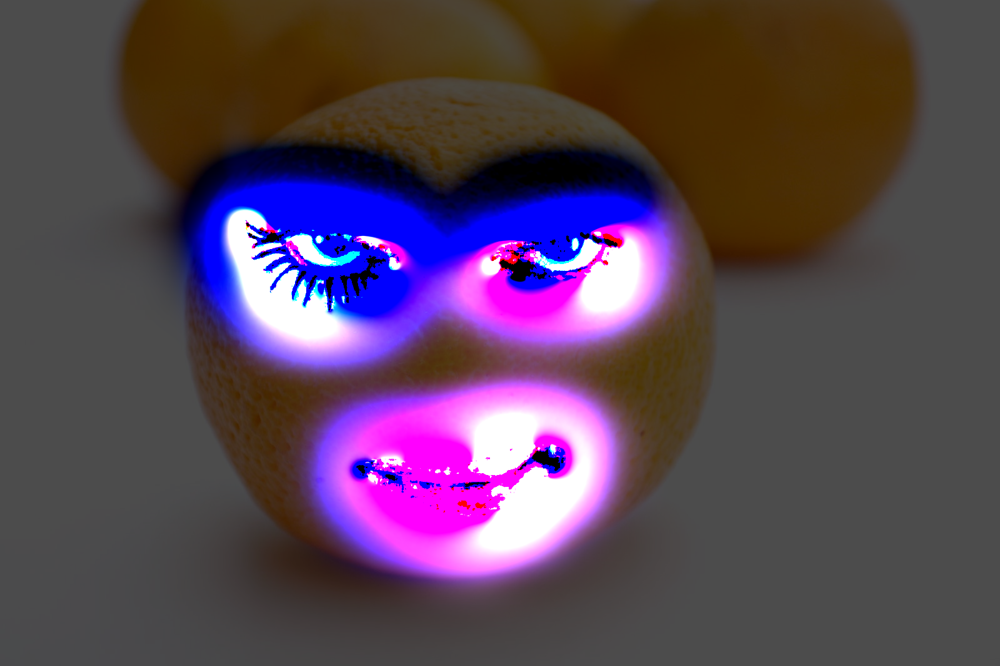

In [16]:
import cv2
import numpy as np

# generate Gaussian pyramid of the two images and the mask
def gaussian_pyramid(img, num_levels): 
  # cv2.pyrDown -> reduce by 1/4
  lower = img.copy()
  gaussian_pyr = [lower]
  for i in range(num_levels):
    lower = cv2.pyrDown(lower)
    gaussian_pyr.append(np.float32(lower))
  return gaussian_pyr

# generate Laplacian pyramid of the two images and the mask
def laplacian_pyramid(gaussian_pyr):
  # cv2.pyrUp -> enlarge by 4
  laplacian_top = gaussian_pyr[-1]
  num_levels = len(gaussian_pyr) - 1 # level = 5
  laplacian_pyr = [laplacian_top]
  for i in range(num_levels,0,-1): 
    size = (gaussian_pyr[i-1].shape[1], gaussian_pyr[i-1].shape[0]) # w, h
    gaussian_expanded = cv2.pyrUp(gaussian_pyr[i], dstsize=size)
    laplacian = np.subtract(gaussian_pyr[i-1], gaussian_expanded)
    laplacian_pyr.append(laplacian)
  return laplacian_pyr


# blending two images with the mask
def blend(laplacian_A,laplacian_B,mask_pyr, alpha = 0.7):
  LS = []
  for la,lb,mask in zip(laplacian_A,laplacian_B,mask_pyr):
    ls = alpha*lb * mask + (1-alpha)*la * (1.0 - mask)
    LS.append(ls)
  return LS

# Reconstruct the original image
def reconstruct(laplacian_pyr):
    laplacian_top = laplacian_pyr[0]
    laplacian_lst = [laplacian_top]
    num_levels = len(laplacian_pyr) -1
    for i in range(num_levels):
      size = (laplacian_pyr[i+1].shape[1], laplacian_pyr[i+1].shape[0])
      laplacian_expanded = cv2.pyrUp(laplacian_top, dstsize=size)
      laplacian_top = cv2.add(laplacian_pyr[i+1], laplacian_expanded, dtype = cv2.CV_32F)
      laplacian_lst.append(laplacian_top)
    return laplacian_lst

# Now let's call all these functions
if __name__ == '__main__':

  # Load images (image size: 1067x1600x3)
  im1_dir = "/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/OriginSample/oranges.jpeg"
  im2_dir = "/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/OriginSample/alex.jpeg"
  mask_dir = '/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem2code/OriginSample/mask.jpeg'

  # Read image files
  im1 = cv2.imread(im1_dir) 
  im2 = cv2.imread(im2_dir)
  mask = cv2.imread(mask_dir)

  num_levels = 6 
    
  # For image-1, calculate Gaussian and Laplacian
  gaussian_pyr_1 = gaussian_pyramid(im1, num_levels)
  laplacian_pyr_1 = laplacian_pyramid(gaussian_pyr_1)

  # For image-2, calculate Gaussian and Laplacian
  gaussian_pyr_2 = gaussian_pyramid(im2, num_levels)
  laplacian_pyr_2 = laplacian_pyramid(gaussian_pyr_2)
  print(laplacian_pyr_2[0].shape)
  # Calculate the Gaussian pyramid for the mask image and reverse it.
  mask_pyr_final = gaussian_pyramid(mask, num_levels)
  mask_pyr_final.reverse()
  # print(mask_pyr_final[0].shape)

  # Blend the images
  add_laplace = blend(laplacian_pyr_1,laplacian_pyr_2,mask_pyr_final)
  # Reconstruct the images
  recon  = reconstruct(add_laplace)

  # Save the final image to the disk
  cv2_imshow(recon[num_levels])


# 3 Camera Estimation (35 points)

- visualization

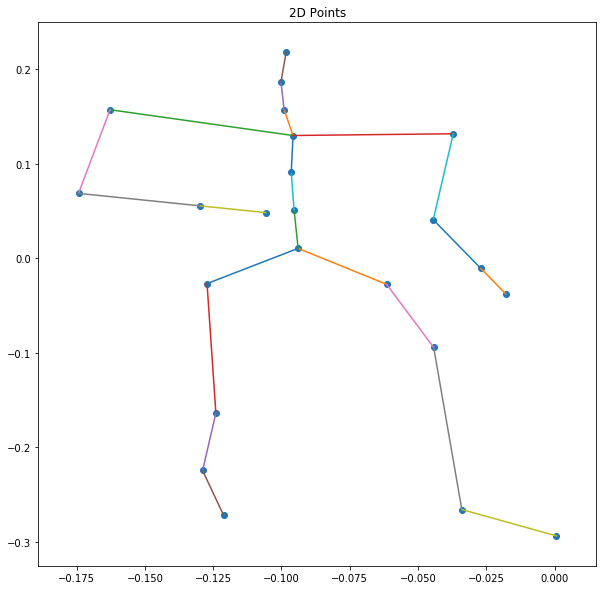

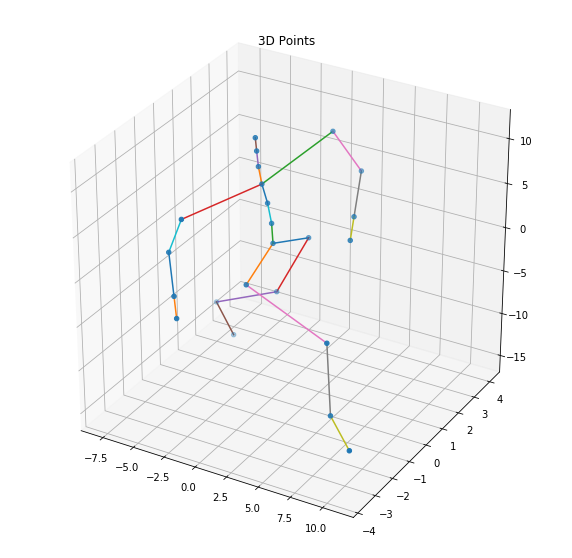

In [17]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import scipy.io as io

def visualize2Dpoints(xy):
    adj = io.loadmat("/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem3code/connectMat.mat")["connectMat"]
    pointX = [v[0] for v in xy]
    pointY = [v[1] for v in xy]
    plt.figure(figsize=(10, 10))
    plt.title("2D Points")
    plt.scatter(pointX, pointY)
    for i in range(adj.shape[0]):
        for j in range(adj.shape[1]):
            if adj[i][j] == 1:
                X = [pointX[i], pointX[j]]
                Y = [pointY[i], pointY[j]]
                plt.plot(X, Y)
    plt.show()

def visualize3Dpoints(XYZ):
    adj = io.loadmat("/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem3code/connectMat.mat")["connectMat"]
    pointX = [v[2] for v in XYZ]
    pointY = [v[0] for v in XYZ]
    pointZ = [v[1] for v in XYZ]

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    plt.title("3D Points")
    ax.scatter(pointX, pointY, pointZ)
    for i in range(adj.shape[0]):
        for j in range(adj.shape[1]):
            if adj[i][j] == 1:
                X = [pointX[i], pointX[j]]
                Y = [pointY[i], pointY[j]]
                Z = [pointZ[i], pointZ[j]]
                ax.plot(X, Y, Z)
    plt.show()

if __name__ == "__main__":

  data = io.loadmat('/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem3code/hw1_problem3.mat') 
  xyz, uv = data['XYZ'], data['xy']

  visualize2Dpoints(uv)
  visualize3Dpoints(xyz)


# Q3.1 Estimating the camera
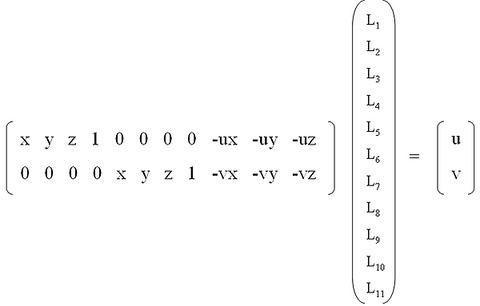

In [18]:
# Direct linear transformation(DLT) to find homography 
def DLT(uv, xyz):
  '''
  uv: coordinates in the image 2D space
  xyz: coordinates in the object 3D space
  '''
  # number of data points
  num = xyz.shape[0]

  # if # of datapoints < 6, DLT cannot be applied. 
  assert num>=6, "DLT need at least six calibration points to calculate"
  assert uv.shape[0] == num, "uv and xyz data points should be match"
  assert xyz.shape[1] == 3, "xyz is 3D point"

  # normalization
  Tr_xyz, norm_xyz = norm(xyz, 3)
  # print(Tr_xyz.shape, norm_xyz.shape)
  Tr_uv, norm_uv = norm(uv[:,:2],2)
  # print(Tr_uv.shape, norm_uv.shape)

  # calculate matrix A
  A = []
  for i in range(num):
    x, y, z = norm_xyz[i,0], norm_xyz[i,1], norm_xyz[i,2]
    u, v = norm_uv[i,0], norm_uv[i,1]
    A.append([x,y,z,1,0,0,0,0,-u*x, -u*y, -u*z, -u])
    A.append([0,0,0,0,x,y,z,1,-v*x, -v*y, -v*z, -v])

  A = np.array(A) 
  U, S, V = np.linalg.svd(A)

  H = V[-1,:]/V[-1,-1]
  # print(H.shape)
  H = H.reshape(3, -1)

  # denormalization
  H = np.dot(np.dot(np.linalg.pinv(Tr_uv), H), Tr_xyz)
  H = H/H[-1,-1]
  return H

def estimateCamera(uv, xyz):
  H = DLT(uv, xyz)
  R, t = H[:, :3], H[:,3]
  return R, t

In [19]:
estimateCamera(uv, xyz)

(array([[-2.00000000e-02,  4.04703415e-18,  1.77431514e-03],
        [ 8.66387160e-18,  2.00785506e-02,  1.00030096e-18],
        [-1.77431514e-03, -1.53903136e-17, -2.00000000e-02]]),
 array([-8.87157568e-02, -1.48240969e-17,  1.00000000e+00]))

# Q3.2 : first 3x3 part of camera matrix M is not the rotation matrix of the camera. explain why 
- answer : M includes K, that is, from M = K[R|t]=K[R|-RC]=[M|-MC], K would be determined by intrinsic and extrinsic parameters of the camera.  

# Q3.3 : Under what condition is the 3x3 matrix a rotation matrix?  
- answer : when K is 3x3 identity matrix. 
 

# Q3.4 : how can we convert the first 3x3 matrix a rotation matrix?  
- answer : RQ decomposition
  * The RQ decomposition transforms a matrix A into the product of an upper triangular matrix R (also known as right-triangular) and an orthogonal matrix Q. The only difference from QR decomposition is the order of these matrices. QR decomposition is Gram–Schmidt orthogonalization of columns of A, started from the first column. RQ decomposition is Gram–Schmidt orthogonalization of rows of A, started from the last row.

# Q3.5 estimateCamera2

In [20]:
from scipy.linalg import rq

# M = K[R|t]=K[R|-RC]=[M|-MC]

def estimateCamera2(uv,xyz):
  # H (3x4 matrix)
  H = DLT(uv, xyz)
  U,S,V = np.linalg.svd(H) # V : 4x4
  
  # calculate C
  C = V[-1, :3]/V[-1,-1]

  # K and R by RQ decomposition
  K, R = rq(H[:3, :3]) 
  D = np.diag(np.sign(np.diag(K)))
  K = K@D
  R = D@R
  t = -R@C

  return R, t

# Q3.6 Visualization

In [21]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import mpl_toolkits.mplot3d.art3d as art3d

def visualize3Dpoints(XYZ, fig, ax):
  adj = io.loadmat("/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem3code/connectMat.mat")["connectMat"]
  pointX = [v[2] for v in XYZ]
  pointY = [v[0] for v in XYZ]
  pointZ = [v[1] for v in XYZ]
  plt.title("3D Points")
  ax.scatter(pointX, pointY, pointZ)
  for i in range(adj.shape[0]):
    for j in range(adj.shape[1]):
      if adj[i][j] == 1:
        X = [pointX[i], pointX[j]]
        Y = [pointY[i], pointY[j]]
        Z = [pointZ[i], pointZ[j]]
        ax.plot(X, Y, Z)

def drawCam(R, t, fig, ax):
  scale = 6.0
  P = scale * np.array([[0.0, 0.0, 0.0],
                        [0.5, 0.5, 0.8],
                        [0.5, -0.5, 0.8],
                        [-0.5, 0.5, 0.8],
                        [-0.5, -0.5, 0.8]])
  t = t.reshape(-1, 1)
  P1_ = R.T @ (P.T - np.tile(t, (1, 5)))
  P1_ = P1_.T
  #fig = plt.figure(figsize=(10, 10))
  #ax = fig.add_subplot(111, projection='3d')

  def P1(i, j):
    return P1_[i - 1, j - 1]

  def line(X, Y, Z, color = 'blue', **kwargs):
    ax.plot(Y, X, Z, color = color)

  line([P1(1,1), P1(2,1)], [P1(1,3), P1(2,3)], [P1(1,2), P1(2,2)], color = 'black')
  line([P1(1,1), P1(3,1)], [P1(1,3), P1(3,3)], [P1(1,2), P1(3,2)], color = 'black')
  line([P1(1,1), P1(4,1)], [P1(1,3), P1(4,3)], [P1(1,2), P1(4,2)], color = 'black')
  line([P1(1,1), P1(5,1)], [P1(1,3), P1(5,3)], [P1(1,2), P1(5,2)], color = 'black')

  line([P1(2,1), P1(3,1)], [P1(2,3), P1(3,3)], [P1(2,2), P1(3,2)], color = 'black')
  line([P1(3,1), P1(5,1)], [P1(3,3), P1(5,3)], [P1(3,2), P1(5,2)], color = 'black')
  line([P1(5,1), P1(4,1)], [P1(5,3), P1(4,3)], [P1(5,2), P1(4,2)], color = 'black')
  line([P1(4,1), P1(2,1)], [P1(4,3), P1(2,3)], [P1(4,2), P1(2,2)], color = 'black')

  cameraPlane = [[P1(2,1), P1(2,3),  P1(2,2)], [P1(4,1), P1(4,3), P1(4,2)], [P1(3,1), P1(3,3), P1(3,2)], [P1(5,1), P1(5,3), P1(5,2)]]
  faces =[1, 0, 2, 3]
  cX = [cameraPlane[p][0] for p in faces]
  cY = [cameraPlane[p][1] for p in faces]
  cZ = [cameraPlane[p][2] for p in faces]

  verts = [list(zip(cY, cX, cZ))]
  patch = art3d.Poly3DCollection(verts, facecolors='green')
  #ax.add_collection3d(patch, zs='z')

  C1 = np.array([P1(2,1), P1(2,3), P1(2,2)])
  C2 = np.array([P1(3,1), P1(3,3), P1(3,2)])
  C3 = np.array([P1(4,1), P1(4,3), P1(4,2)])
  C4 = np.array([P1(5,1), P1(5,3), P1(5,2)])

  O = np.array([P1(1,1), P1(1,3), P1(1,2)])
  Cmid = 0.25 * (C1 + C2 + C3 + C4);

  Lz = np.stack([O, O + 0.5 * (Cmid - O)])
  Lx = np.stack([O, O + 0.5 * (C1 - C3)])
  Ly = np.stack([O, O + 0.5 * (C1 - C2)])
  line(Lz[:, 0], Lz[:, 1], Lz[:, 2], color = 'blue', linewidth = 2)
  line(Lx[:, 0], Lx[:, 1], Lx[:, 2], color = 'green', linewidth = 2)
  line(Ly[:, 0], Ly[:, 1], Ly[:, 2], color = 'red', linewidth = 2)

  #plt.show()

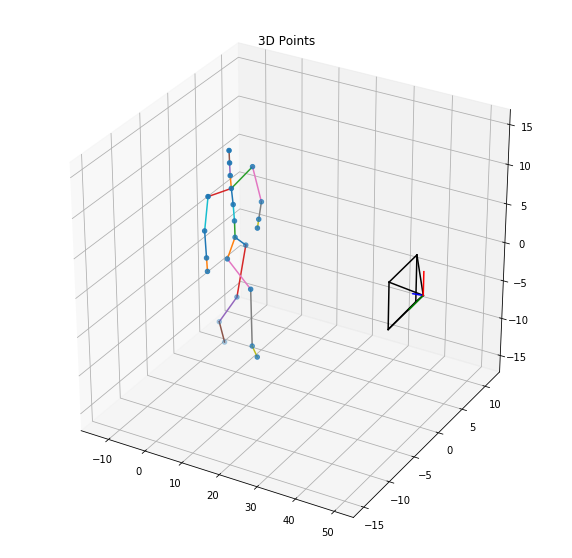

In [22]:
if __name__ == "__main__":
  data = io.loadmat('/content/drive/MyDrive/Colab Notebooks/CSCE5703/HW1/HW1/homework1/problem3code/hw1_problem3.mat') 
  xyz, uv = data['XYZ'], data['xy']
  R, t = estimateCamera2(uv,xyz)

  fig = plt.figure(figsize = (10, 10))
  ax = fig.add_subplot(111, projection = '3d')

  #cubic bounding box : max value of x, y, z range
  max_range = np.array([xyz[:,0].max() - xyz[:,0].min(), # x - range
                       xyz[:,1].max() - xyz[:,1].min(), # y - range
                       xyz[:,2].max() - xyz[:,2].min()]).max() # z -range

  Xb = 0.5*max_range*np.mgrid[-1:2:2,-1:2:2,-1:2:2][0].flatten() + 0.5*(xyz[:,0].max()+xyz[:,0].min())
  Yb = 0.5*max_range*np.mgrid[-1:2:2,-1:2:2,-1:2:2][1].flatten() + 0.5*(xyz[:,1].max()+xyz[:,1].min())
  Zb = 0.5*max_range*np.mgrid[-1:2:2,-1:2:2,-1:2:2][2].flatten() + 0.5*(xyz[:,2].max()+xyz[:,2].min())

  for xb, yb, zb in zip(Xb, Yb, Zb):
    ax.plot([xb], [yb], [zb], 'w')

  visualize3Dpoints(xyz, fig, ax)
  drawCam(R, t, fig, ax)
  plt.show()